# 

In [25]:
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np
df = pd.read_csv('dataTableStudents_summer.csv')
df=df[:604800]


In [26]:
df['index'] = df.index
df['sumconsumtion']=df['engMdoConsumption_0_']+df['engMdoConsumption_1_']+df['engMdoConsumption_2_']+df['engMdoConsumption_3_']
df['load'] = df['thrusterAndPropulsion'] + df['hotelLoad']
df.loc[df['operationId'] == 100, 'operationId'] = 10
battery_dat = df['battery_0__actualPower'][70000:92000]
smol_df= df[70000:92000]

In [27]:
plt.rcParams["figure.figsize"] = (20, 10)

In [28]:
display(df)

,timeVectRelMinutes,datetime,battery_0__actualPower,thrusterAndPropulsion,sumEngMdoPower,hotelLoad,shorePowerEstimated,numberOfMdoEnginesRunning,operationId,dpMode,...,engMdoPerformance_2_,engMdoPerformance_3_,engMdoConsumption_0_,engMdoConsumption_1_,engMdoConsumption_2_,engMdoConsumption_3_,speedOverGround,index,sumconsumtion,load
0,12:00:00 AM,6/1/2020 0:00,0,1056.00,1447,391.00,0,1,3,0,...,0,0.000,356.95,0,0.0,0.00,10.110,0,356.95,1447.0
1,12:24:00 AM,6/1/2020 0:00,0,1034.00,1465,431.00,0,1,3,0,...,0,0.000,365.00,0,0.0,0.00,9.962,1,365.00,1465.0
2,12:48:00 AM,6/1/2020 0:00,0,1056.00,1548,492.00,0,1,3,0,...,0,0.000,378.55,0,0.0,0.00,9.884,2,378.55,1548.0
3,1:12:00 AM,6/1/2020 0:00,0,1078.00,1562,484.00,0,1,3,0,...,0,0.000,380.10,0,0.0,0.00,9.964,3,380.10,1562.0
4,1:36:00 AM,6/1/2020 0:00,0,1078.00,1519,441.00,0,1,3,0,...,0,0.000,369.90,0,0.0,0.00,10.023,4,369.90,1519.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
604795,8:53:56 PM,6/7/2020 23:25,8,201.66,566,372.34,0,2,10,2,...,0,340.415,117.90,0,0.0,118.85,0.563,604795,236.75,574.0
604796,9:17:56 PM,6/7/2020 23:25,14,250.30,626,389.70,0,2,10,2,...,0,326.807,120.85,0,0.0,124.30,0.494,604796,245.15,640.0
604797,9:41:56 PM,6/7/2020 23:25,1,245.47,641,396.53,0,2,10,2,...,0,342.362,120.75,0,0.0,127.05,0.925,604797,247.80,642.0
604798,10:05:56 PM,6/7/2020 23:25,1,152.66,552,400.34,0,2,10,2,...,0,417.971,111.85,0,0.0,123.70,0.925,604798,235.55,553.0


In [29]:
df.describe()
dfslice=df.copy()
dfslice.describe()

,battery_0__actualPower,thrusterAndPropulsion,sumEngMdoPower,hotelLoad,shorePowerEstimated,numberOfMdoEnginesRunning,operationId,dpMode,engMdoPower_0_,engMdoPower_1_,...,engMdoPerformance_2_,engMdoPerformance_3_,engMdoConsumption_0_,engMdoConsumption_1_,engMdoConsumption_2_,engMdoConsumption_3_,speedOverGround,index,sumconsumtion,load
count,604800.000000,604800.000000,604800.000000,604800.000000,604800.000000,604800.000000,604800.000000,604800.000000,604800.000000,604800.0,...,604800.0,604800.000000,604800.000000,604800.0,604800.000000,604800.000000,604800.000000,604800.00000,604800.000000,604800.000000
mean,-2.131971,512.880380,844.276174,385.319013,56.055190,1.030228,4.901194,0.045802,728.274453,0.0,...,0.0,69.430655,193.306967,0.0,0.035845,36.654109,3.965316,302399.50000,229.996920,898.199393
std,48.893625,563.114597,727.997555,130.756990,113.290393,0.655986,2.665293,0.296793,662.403910,0.0,...,0.0,145.710791,152.501886,0.0,1.572030,76.203668,4.476527,174590.86574,171.203947,677.699664
min,-631.000000,0.000000,0.000000,-251.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,...,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.00000,0.000000,44.000000
25%,0.000000,0.000000,228.000000,250.000000,0.000000,1.000000,3.000000,0.000000,205.000000,0.0,...,0.0,0.000000,97.850000,0.0,0.000000,0.000000,0.030000,151199.75000,102.700000,250.000000
50%,0.000000,169.490000,552.000000,373.000000,0.000000,1.000000,3.000000,0.000000,423.000000,0.0,...,0.0,0.000000,133.100000,0.0,0.000000,0.000000,0.751000,302399.50000,208.100000,553.000000
75%,0.000000,1100.000000,1587.000000,490.000000,0.000000,1.000000,7.000000,0.000000,1541.000000,0.0,...,0.0,0.000000,373.450000,0.0,0.000000,0.000000,9.424000,453599.25000,385.800000,1592.000000
max,866.000000,2682.980000,3694.000000,1534.910000,356.000000,3.000000,10.000000,2.000000,2071.000000,0.0,...,0.0,20024.800000,524.750000,0.0,124.650000,485.450000,48.742000,604799.00000,937.850000,3694.000000


In [30]:
socpros = np.zeros(604800)
soc = np.zeros(604800)

bat=df['battery_0__actualPower'].values.copy()
bat=bat/3600  # from kW-kWh


# state of charge
with a lossfactor of 97,5%, else the graf would forever go upwards, as there are more kWh charged(-) than discharged.

In [38]:
soc[0] = 186
socpros[0] = 30
for i in range(len(soc)):
    if i == 0:
        pass
    elif i >=0 and bat[i] > 0:
        soc[i] = soc[i-1] - bat[i]
        socpros[i] = soc[i]/620*100
    elif i >=0 and bat[i] <= 0:
        soc[i] = soc[i-1] - bat[i]*0.955
        socpros[i] = soc[i]/620*100

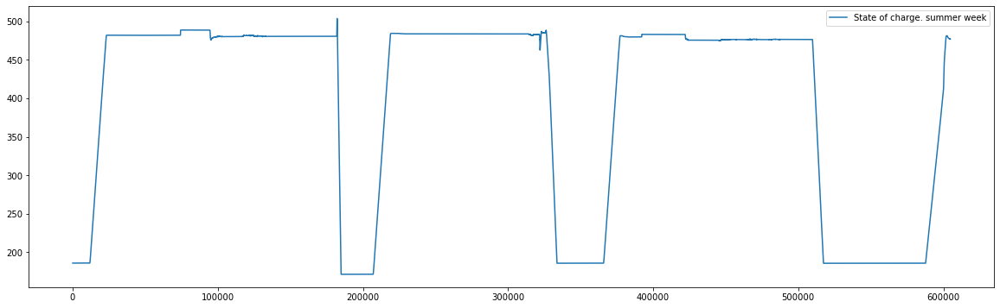

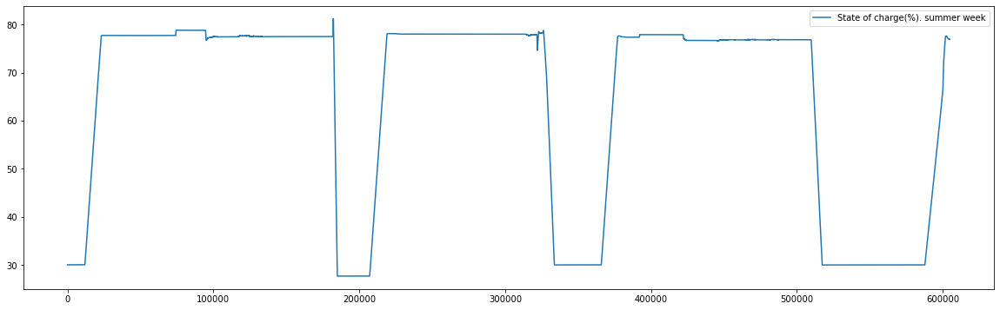

In [39]:
fig=plt.figure(figsize=(20,6))
plt.plot(soc,label='State of charge. summer week')
plt.legend()

fig=plt.figure(figsize=(20,6))
plt.plot(socpros,label='State of charge(%). summer week')
plt.legend()

#  map out when the state of charge is above 70% 

In [74]:
opid=df['operationId'].values.copy()

i=0
j=604800
soc_over70=0
soc_above70=[0]*604800
soc_over70dpmode=0
timesdp=0
while i < j:
    if opid[i]==10:
        timesdp+=1
    if socpros[i]> 70:
        soc_over70+=1
        soc_above70[i]=11
        if opid[i]==10:
            soc_over70dpmode+=1
    else:
        soc_above70[i]=0
        
    i+=1
df['soc_above70'] = soc_above70
print('times state of charge over 70%=',soc_over70)
print('times state of charge over 70% and also in dp mode=',soc_over70dpmode,'out of',timesdp,'times.',timesdp-soc_over70dpmode,'diff')


times state of charge over 70%= 412878
times state of charge over 70% and also in dp mode= 73418 out of 74107 times. 689 diff


<AxesSubplot:xlabel='index'>

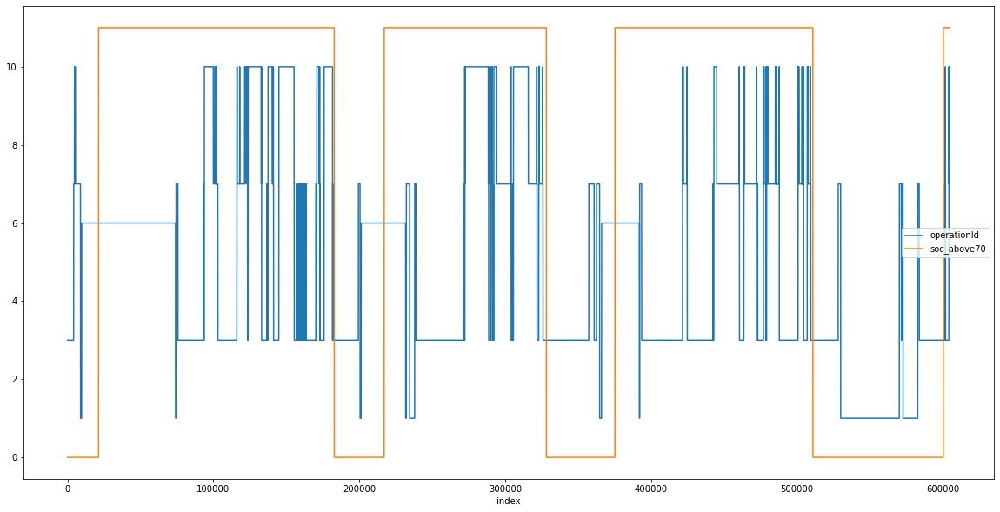

In [41]:
df.plot('index', ['operationId', 'soc_above70'])

# Overview funcion of kWh, distance, fuel

In [43]:


bat=df['battery_0__actualPower'].values.copy()
bat=bat/3600



fuel_ls=df['sumconsumtion'].values.copy()
fuel_ls=fuel_ls/3600

load_kwh=df['load'].values.copy()
load_kwh=load_kwh/3600

sumeng_kwh=df['sumEngMdoPower'].values.copy()
sumeng_kwh=sumeng_kwh/3600

travel_ms=df['speedOverGround'].values.copy()
travel_ms=travel_ms*0.514444 #make knop to m/s, since out data is 1 sec per point.
#prop_kwh=df['thrusterAndPropulsion'].values.copy()
#prop_kwh=prop_kwh/3600


df['soc'] = soc
df['soc %'] = socpros
#df['load_kwh'] = load_kwh
#df['prop_kwh'] = prop_kwh

In [75]:
posSUM=0
negSUM=0
sumload_kwh=0
sumsumeng_kwh=0
case_traveled=0
case_fuel=0
i=0+86400*0            # 1day=24hours*60min*60sec=86 400
j=i+86400*7+3600*0           #1hour=60min*60sec=3600
startTime=i
duration=j-i
while i < j:
    sumload_kwh=load_kwh[i]+sumload_kwh
    sumsumeng_kwh=sumeng_kwh[i]+sumsumeng_kwh
    case_traveled=case_traveled+travel_ms[i]
    case_fuel=case_fuel+fuel_ls[i]
    if bat[i] > 0:
        posSUM=bat[i]+posSUM
    elif bat[i] <= 0:
        negSUM=bat[i]+negSUM
    i += 1

case=[['Case start time',str(datetime.timedelta(seconds=startTime)),'time'],
     ['Duration',str(datetime.timedelta(seconds=duration)),'time'],
     ['total power from load',sumload_kwh,'kWh'],
     ['total power for all engines',sumsumeng_kwh,'kWh'],
     ['engine could be operated at 2100kW at',sumsumeng_kwh/2100,'hours'],
     ['(battery discharg/sumengines used)*100',posSUM/sumsumeng_kwh*100,'%'],
     ['discharged',posSUM,'kWh'],
     ['charged',negSUM,'kWh'],
     ['discharged/charged*100',posSUM/-negSUM*100,'%'],
     ['distance traveled',case_traveled/1000,'km'],
     ['Fuel consumed',case_fuel,'liters'],
     ['liters pr km',case_fuel/(case_traveled/1000),'liter/km'],
     ['liters pr kwh from SUM diselEng',case_fuel/sumsumeng_kwh,'liter/SumEng_kWh'],
     [' km pr liter',(case_traveled/1000)/case_fuel,'km/liter'],
     [' kwh from SUM diselEng pr liter',sumsumeng_kwh/case_fuel,'SumEng_kWh/liter']
     ]
dfcase = pd.DataFrame(case, columns =['action','value', 'unit'])
print(dfcase)

                                    action            value              unit
0                          Case start time          0:00:00              time
1                                 Duration  7 days, 0:00:00              time
2                    total power from load    150897.498055               kWh
3              total power for all engines    141838.397222               kWh
4    engine could be operated at 2100kW at        67.542094             hours
5   (battery discharg/sumengines used)*100          0.80416                 %
6                               discharged        1140.6075               kWh
7                                  charged     -1498.778611               kWh
8                   discharged/charged*100        76.102467                 %
9                        distance traveled      1233.751425                km
10                           Fuel consumed     38639.482597            liters
11                            liters pr km        31.318693     

#  mapping out how far the vessel has traveled


In [44]:
travel_plot=[0]*604800
for i in range(len(travel_plot)):
    if i == 0:
        pass
    else:
        travel_plot[i] = travel_plot[i-1] + travel_ms[i]/1000

In [45]:
print(travel_plot[603999])

1233.0283737389598


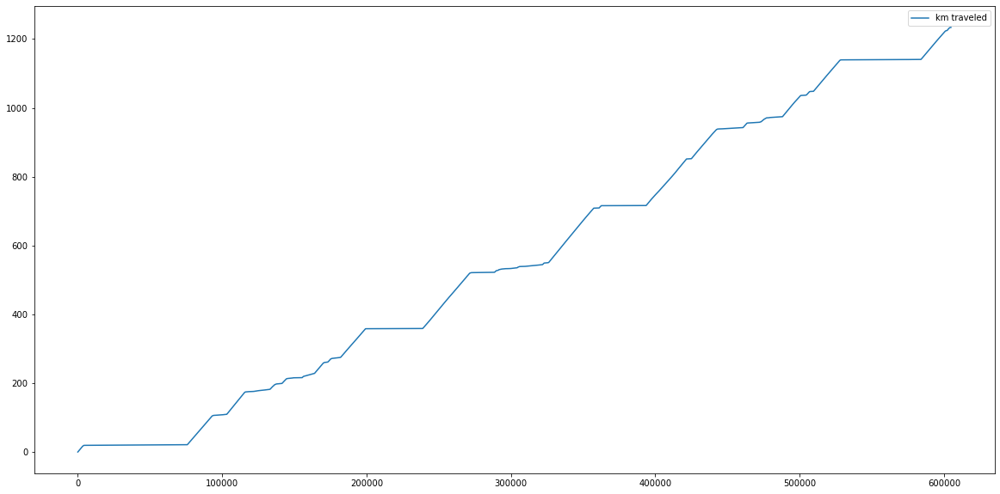

In [46]:
fig=plt.figure(figsize=(20,10))
plt.plot(travel_plot,label='km traveled')
plt.legend()


In [47]:
sumload_kwh=0
sumsumeng_kwh=0
for i in range(len(load_kwh)):
    sumload_kwh=load_kwh[i]+sumload_kwh
    sumsumeng_kwh=sumeng_kwh[i]+sumsumeng_kwh
print('total kWh for load=',sumload_kwh)
print('total kWh for all engines=',sumsumeng_kwh)
print('engine could be operated at 2100kW at ',sumsumeng_kwh/2100,'hours')


total kWh for load= 150897.49805540623
total kWh for all engines= 141838.3972222229
engine could be operated at 2100kW at  67.54209391534424 hours


In [48]:
posSUM=0
negSUM=0
for i in range(len(bat)):
    if i == 0:
        pass
    elif i <= 604798 and bat[i] > 0:
        posSUM=bat[i]+posSUM
    elif i <= 604798 and bat[i] <= 0:
        negSUM=bat[i]+negSUM
print(posSUM,negSUM)
eff=posSUM/negSUM
print(eff)

1140.60750000026 -1498.7755555555793
-0.7610262228872885


In [49]:
batpros=0
batpros=posSUM/sumsumeng_kwh*100
print(batpros)

0.8041598906488152


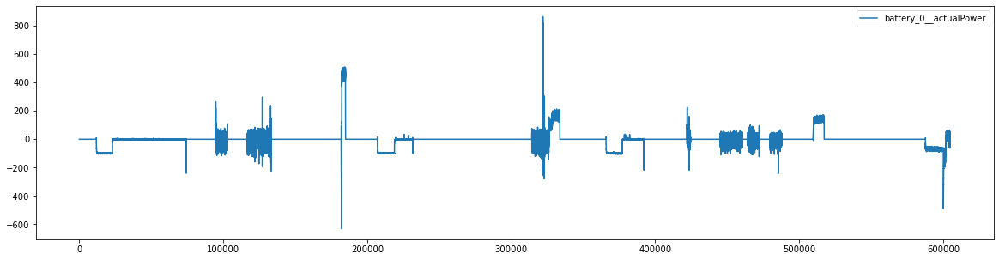

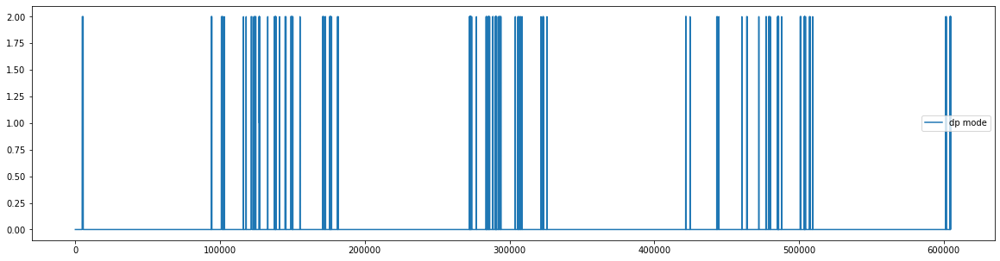

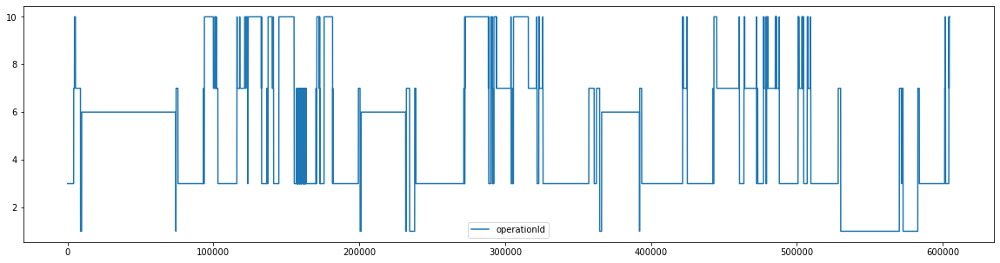

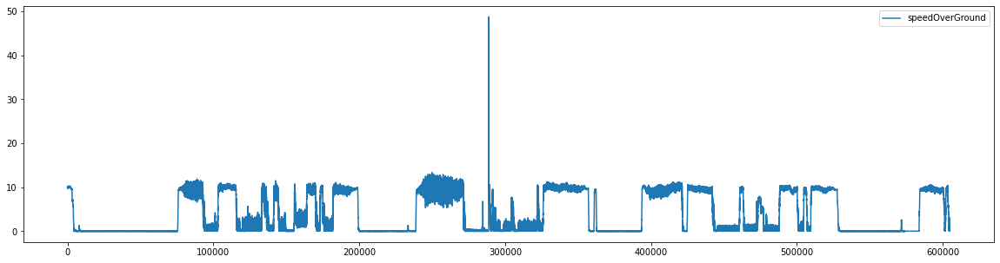

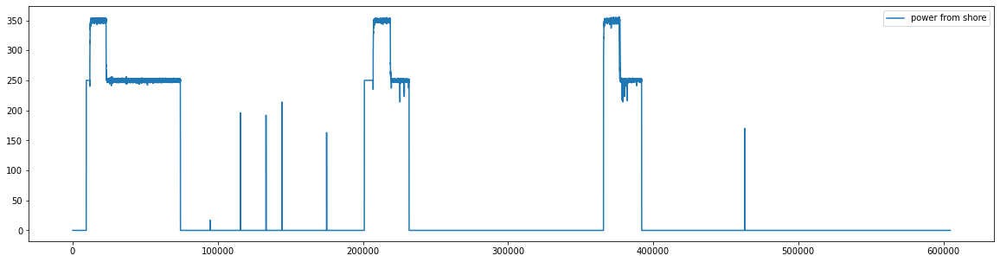

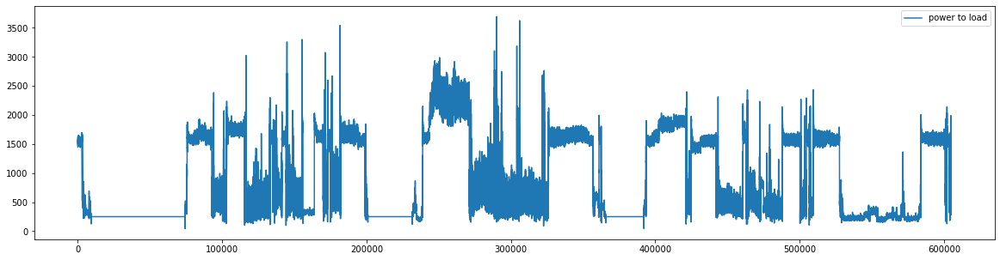

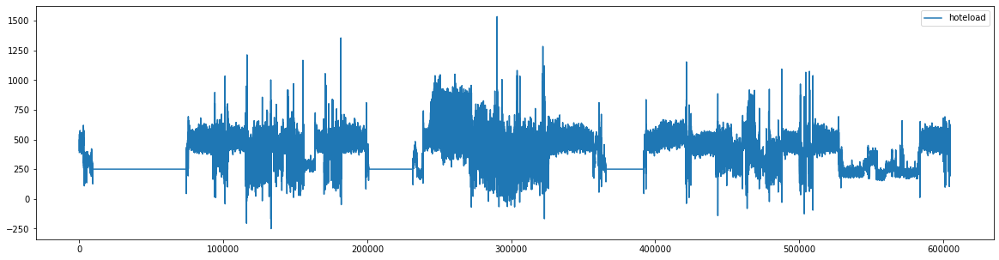

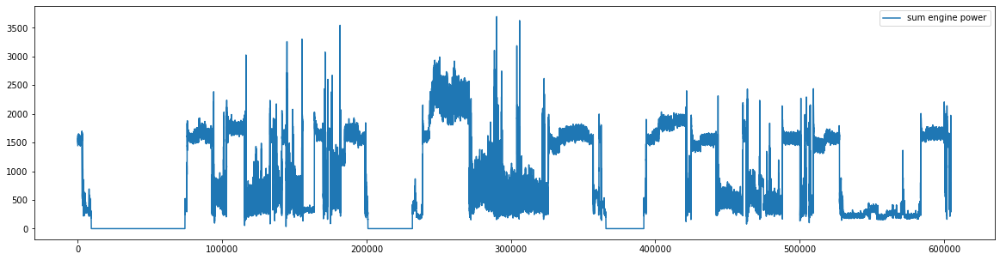

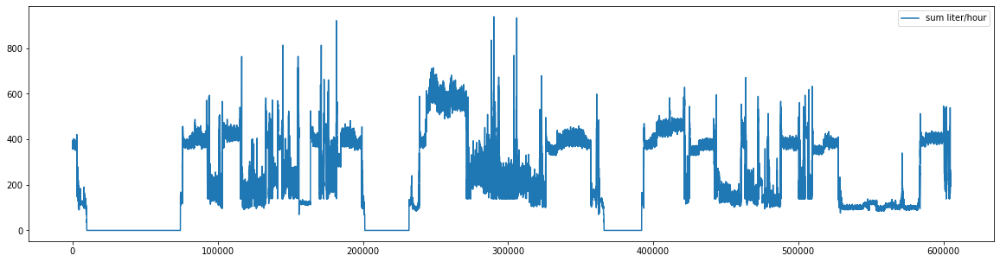

In [50]:
fig=plt.figure(figsize=(20,5))
plt.plot(df['battery_0__actualPower'],label='battery_0__actualPower')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['dpMode'],label='dp mode')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['operationId'],label='operationId')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['speedOverGround'],label='speedOverGround')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['shorePowerEstimated'],label='power from shore')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['load'],label='power to load')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['hotelLoad'],label='hoteload')
plt.legend()
plt.show()


fig=plt.figure(figsize=(20,5))
plt.plot(df['sumEngMdoPower'],label='sum engine power')
plt.legend()
plt.show()

fig=plt.figure(figsize=(20,5))
plt.plot(df['sumconsumtion'],label='sum liter/hour')
plt.legend()
plt.show()

In [51]:
plt.rcParams["figure.figsize"] = (20, 10)

<AxesSubplot:xlabel='index'>

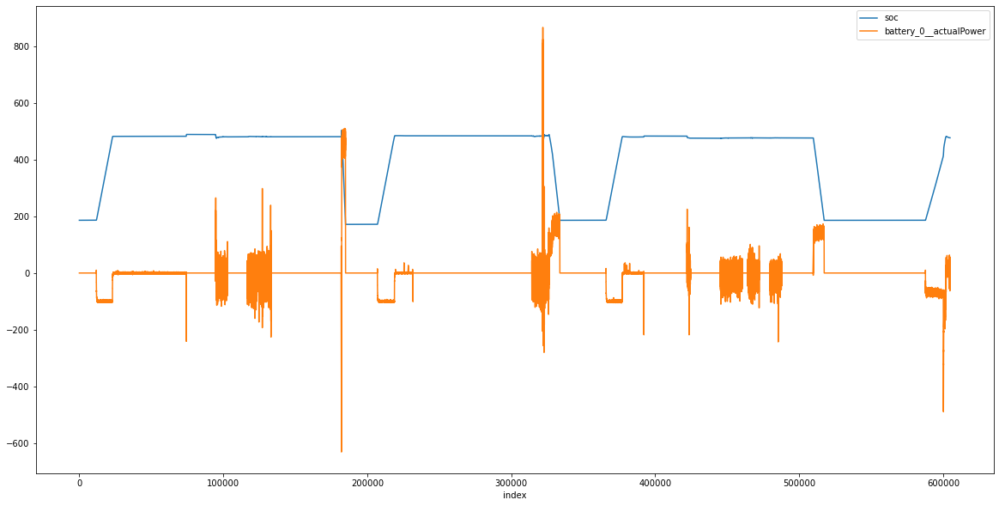

In [52]:
df.plot('index', ['soc', 'battery_0__actualPower'])


# 72000:91700, hour 20-25,5=5,5hr
DP mode+ litt standby

In [53]:
px.line(df[70000:95000],y="dpMode")

In [54]:
px.line(df[70000:95000], y="operationId")

In [55]:
px.line(df[70000:95000],x='datetime',y="soc")

In [56]:
px.line(df[70000:95000],x='datetime', y="speedOverGround")

In [57]:
px.line(df[70000:95000],x='datetime',y="sumEngMdoPower")

In [58]:
px.line(df[70000:92000],x='datetime', y="battery_0__actualPower")

In [59]:
sektiltime=80000
print(sektiltime/3600)

22.22222222222222


In [60]:
import datetime
str(datetime.timedelta(seconds=800000))

'9 days, 6:13:20'

In [62]:
posSUM=0
negSUM=0
sumload_kwh=0
sumsumeng_kwh=0
case_traveled=0
case_fuel=0
i=72000+86400*0            # 1day=24hours*60min*60sec=86 400
j=i+86400*0+3600*1           #1hour=60min*60sec=3600
startTime=i
duration=j-i
while i < j:
    sumload_kwh=load_kwh[i]+sumload_kwh
    sumsumeng_kwh=sumeng_kwh[i]+sumsumeng_kwh
    case_traveled=case_traveled+travel_ms[i]
    case_fuel=case_fuel+fuel_ls[i]
    if bat[i] > 0:
        posSUM=bat[i]+posSUM
    elif bat[i] <= 0:
        negSUM=bat[i]+negSUM
    i += 1

case=[['Case start time',str(datetime.timedelta(seconds=startTime)),'time'],
     ['Duration',str(datetime.timedelta(seconds=duration)),'time'],
     ['total power from load',sumload_kwh,'kWh'],
     ['total power for all engines',sumsumeng_kwh,'kWh'],
     ['engine could be operated at 2100kW at',sumsumeng_kwh/2100,'hours'],
     ['(battery discharged/sum engines used)*100',posSUM/sumsumeng_kwh*100,'%'],
     ['discharged',posSUM,'kWh'],
     ['charged',negSUM,'kWh'],
     ['discharged/charged*100',posSUM/-negSUM*100,'%'],
     ['distance traveled',case_traveled/1000,'km'],
     ['Fuel consumed',case_fuel,'liters'],
     ['liters pr km',case_fuel/(case_traveled/1000),'liter/km'],
     ['liters pr kwh from SUM diselEng',case_fuel/sumsumeng_kwh,'liter/SumEng_kWh'],
     [' km pr liter',(case_traveled/1000)/case_fuel,'km/liter'],
     [' kwh from SUM diselEng pr liter',sumsumeng_kwh/case_fuel,'SumEng_kWh/liter']
     ]
dfcase = pd.DataFrame(case, columns =['action','value', 'unit'])
print(dfcase)

                                       action       value              unit
0                             Case start time    20:00:00              time
1                                    Duration     1:00:00              time
2                       total power from load  309.989722               kWh
3                 total power for all engines  164.601667               kWh
4       engine could be operated at 2100kW at    0.078382             hours
5   (battery discharged/sum engines used)*100    0.148338                 %
6                                  discharged    0.244167               kWh
7                                     charged   -7.535556               kWh
8                      discharged/charged*100    3.240195                 %
9                           distance traveled     0.09054                km
10                              Fuel consumed   52.665389            liters
11                               liters pr km  581.683653          liter/km
12          

# 281385:321416, hour 78,16-89,28= day3 hour 6,16-17,28
DP mode+ litt standby

In [ ]:
px.line(df[275000:325000], y="operationId")

In [ ]:
px.line(df[275000:325000], y="dpMode")

In [ ]:
px.line(df[275000:325000], y="battery_0__actualPower")

In [ ]:
px.line(df[275000:325000], y="speedOverGround")